In [679]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

In [681]:
pio.renderers.default = 'png'

#### Loading Data

In [342]:
df = pd.read_csv("data.csv")

#### Data Inspection

In [344]:
df.shape

(3998, 39)

In [346]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [348]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [350]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             3998 non-null   object 
 1   ID                     3998 non-null   int64  
 2   Salary                 3998 non-null   float64
 3   DOJ                    3998 non-null   object 
 4   DOL                    3998 non-null   object 
 5   Designation            3998 non-null   object 
 6   JobCity                3998 non-null   object 
 7   Gender                 3998 non-null   object 
 8   DOB                    3998 non-null   object 
 9   10percentage           3998 non-null   float64
 10  10board                3998 non-null   object 
 11  12graduation           3998 non-null   int64  
 12  12percentage           3998 non-null   float64
 13  12board                3998 non-null   object 
 14  CollegeID              3998 non-null   int64  
 15  Coll

#### Converting Date Columns into Proper Datetime Format

In [352]:
df['DOJ'] = pd.to_datetime(df['DOJ'], errors='coerce')
df["DOB"] = pd.to_datetime(df["DOB"])
df['DOL'] = pd.to_datetime(df['DOL'].replace('Present', pd.Timestamp('today')), errors='coerce')

C:\Users\kanis\AppData\Local\Temp\ipykernel_9956\3234897365.py:1: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

C:\Users\kanis\AppData\Local\Temp\ipykernel_9956\3234897365.py:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

C:\Users\kanis\AppData\Local\Temp\ipykernel_9956\3234897365.py:3: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



#### Checking Null Values

In [356]:
df.isnull().sum()

Unnamed: 0                  0
ID                          0
Salary                      0
DOJ                         0
DOL                      1875
Designation                 0
JobCity                     0
Gender                      0
DOB                         0
10percentage                0
10board                     0
12graduation                0
12percentage                0
12board                     0
CollegeID                   0
CollegeTier                 0
Degree                      0
Specialization              0
collegeGPA                  0
CollegeCityID               0
CollegeCityTier             0
CollegeState                0
GraduationYear              0
English                     0
Logical                     0
Quant                       0
Domain                      0
ComputerProgramming         0
ElectronicsAndSemicon       0
ComputerScience             0
MechanicalEngg              0
ElectricalEngg              0
TelecomEngg                 0
CivilEngg 

#### Checking Duplicated Rows

In [358]:
df.duplicated().sum()

0

<div style="text-align: center;">
    <h1><em>Seperating Numerical and Categorical Columns</em></h1>
</div>

<div style="text-align: center;">
    <h2><em>Univariate Analysis</em></h2>
</div>

In [361]:
num = df.select_dtypes(include = ["int64","float64","datetime64[ns]"])
cat = df.select_dtypes(include = ["object"])

<div style="text-align: center;">
    <h3><em>Numerical Columns</em></h3>
</div>

In [365]:
num.columns

Index(['ID', 'Salary', 'DOJ', 'DOL', 'DOB', '10percentage', '12graduation',
       '12percentage', 'CollegeID', 'CollegeTier', 'collegeGPA',
       'CollegeCityID', 'CollegeCityTier', 'GraduationYear', 'English',
       'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg',
       'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')

In [367]:
req_num_cols = ['Salary','10percentage','12percentage','collegeGPA','English','Logical','Quant','Domain','ElectronicsAndSemicon','ComputerScience',
               'MechanicalEngg','ElectricalEngg','TelecomEngg','CivilEngg','conscientiousness','agreeableness','extraversion','nueroticism','openess_to_experience']

#### Statistical Summary of Numerical Data

In [507]:
def num_univariate_statistical_analysis(columns):
    for col in columns:
        print("*"*10,f"{col}","*"*10)
        print(df[col].agg(["mean","median","std","skew","kurtosis","min","max"]))
        print()
num_univariate_statistical_analysis(req_num_cols)

********** Salary **********
mean        3.076998e+05
median      3.000000e+05
std         2.127375e+05
skew        6.451081e+00
kurtosis    8.093000e+01
min         3.500000e+04
max         4.000000e+06
Name: Salary, dtype: float64

********** 10percentage **********
mean        77.925443
median      79.150000
std          9.850162
skew        -0.591019
kurtosis    -0.110284
min         43.000000
max         97.760000
Name: 10percentage, dtype: float64

********** 12percentage **********
mean        74.466366
median      74.400000
std         10.999933
skew        -0.032607
kurtosis    -0.630737
min         40.000000
max         98.700000
Name: 12percentage, dtype: float64

********** collegeGPA **********
mean        71.486171
median      71.720000
std          8.167338
skew        -1.249209
kurtosis    10.234244
min          6.450000
max         99.930000
Name: collegeGPA, dtype: float64

********** English **********
mean        501.649075
median      500.000000
std         104.940

#### Visualizing Numerical Data

********** Salary **********


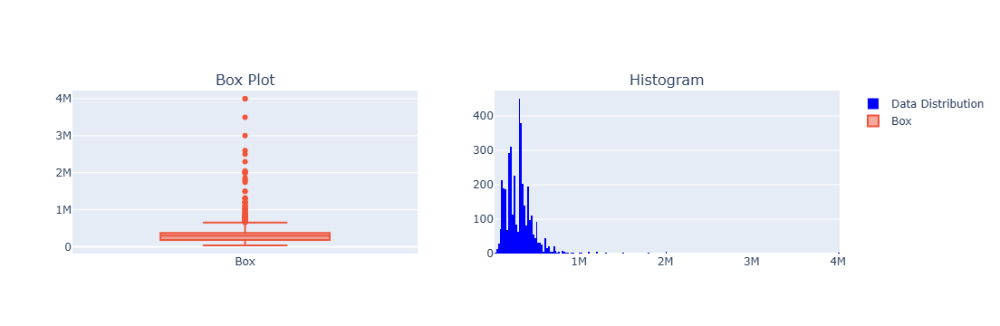

********** 10percentage **********


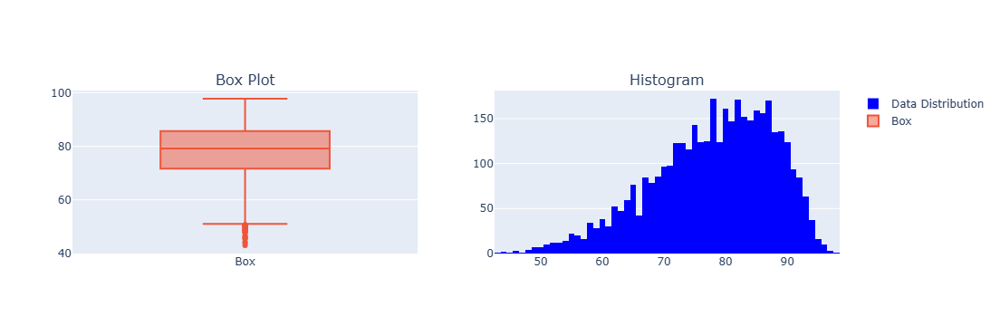

********** 12percentage **********


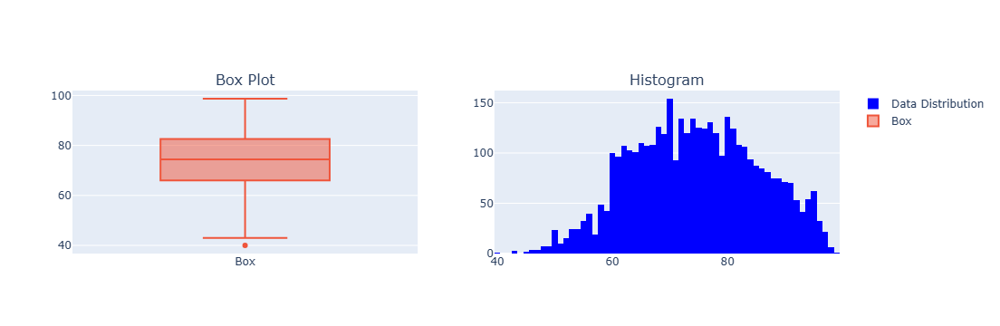

********** collegeGPA **********


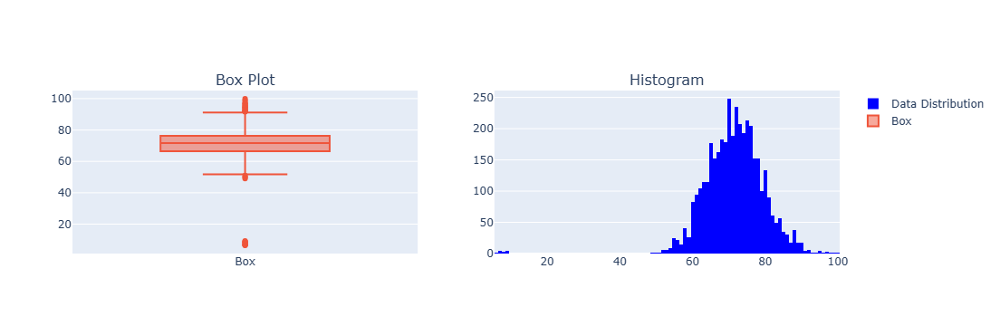

********** English **********


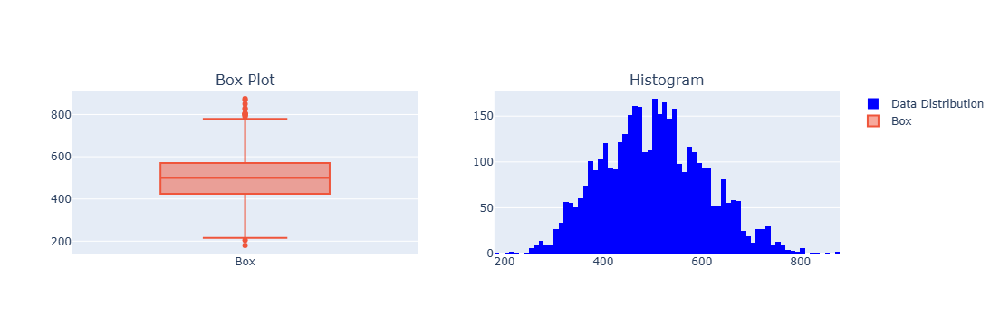

********** Logical **********


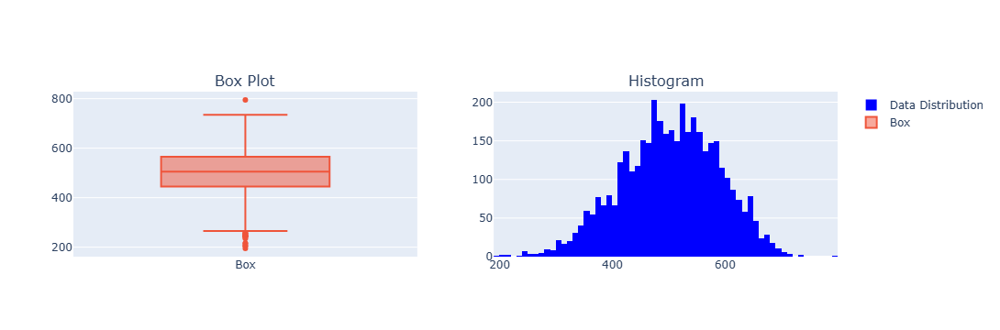

********** Quant **********


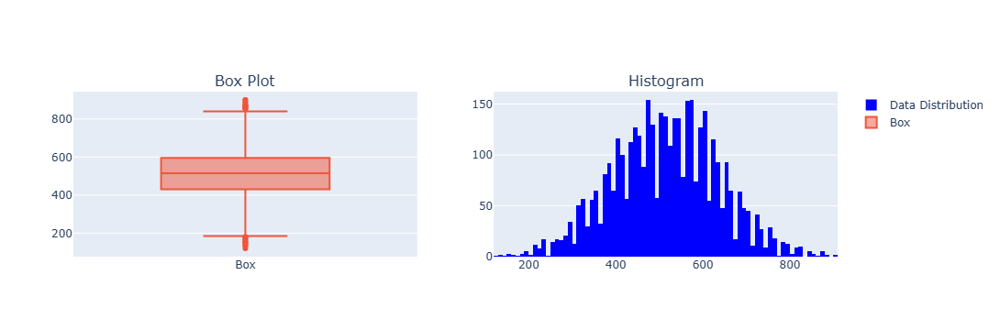

********** Domain **********


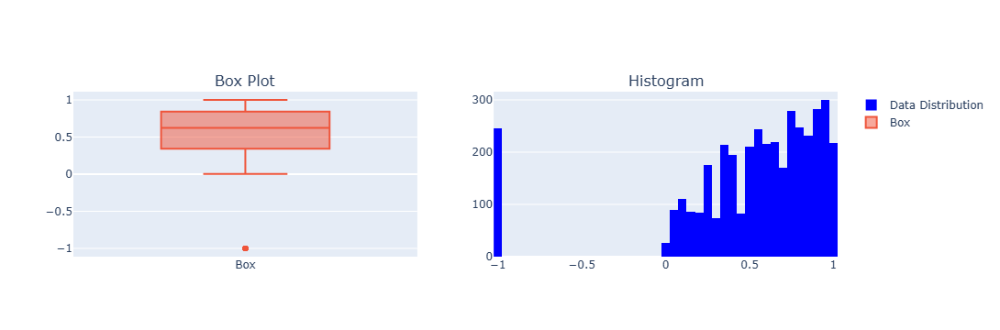

********** ElectronicsAndSemicon **********


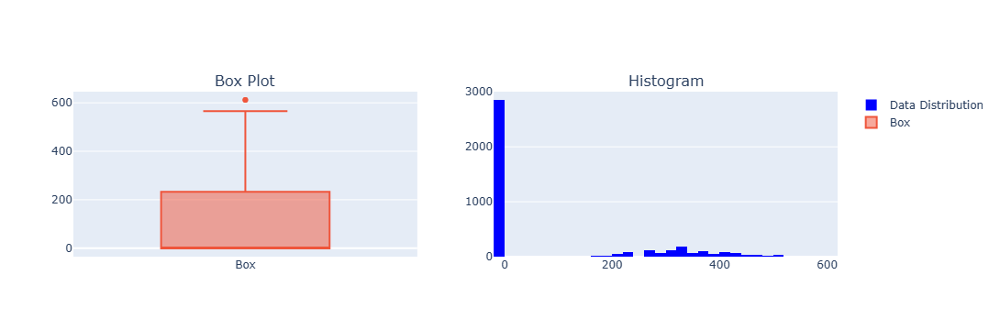

********** ComputerScience **********


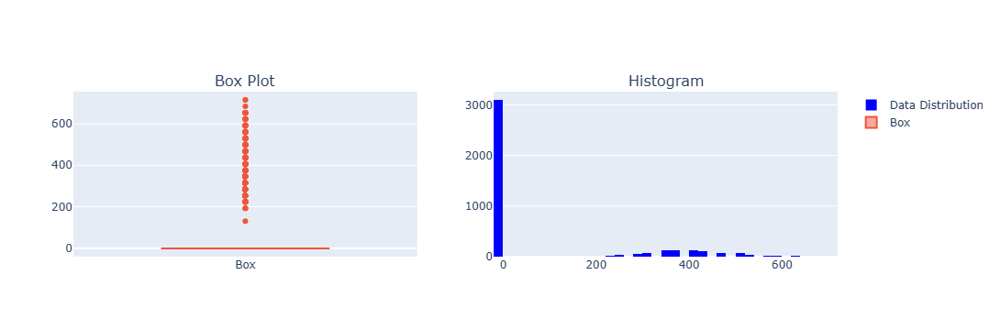

********** MechanicalEngg **********


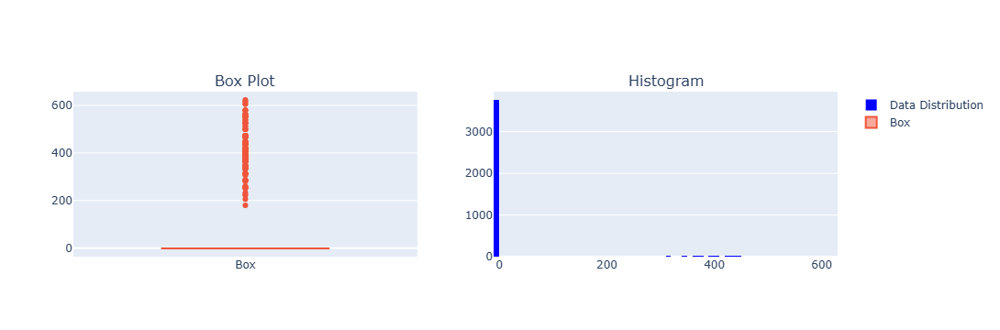

********** ElectricalEngg **********


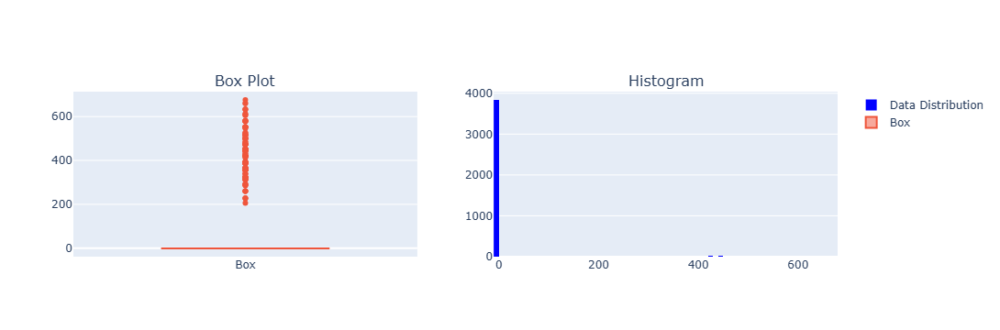

********** TelecomEngg **********


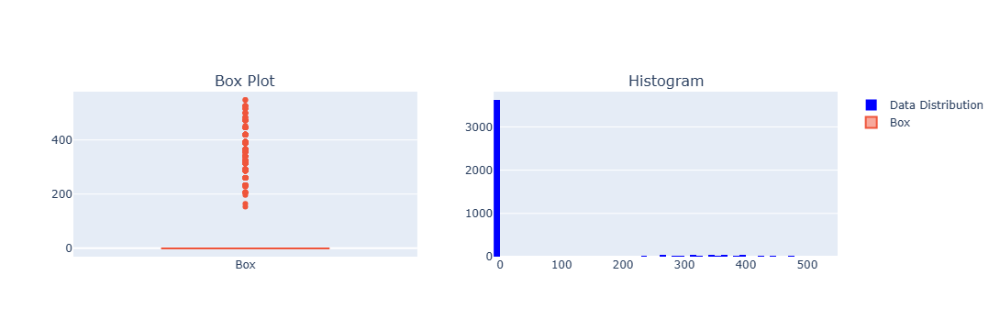

********** CivilEngg **********


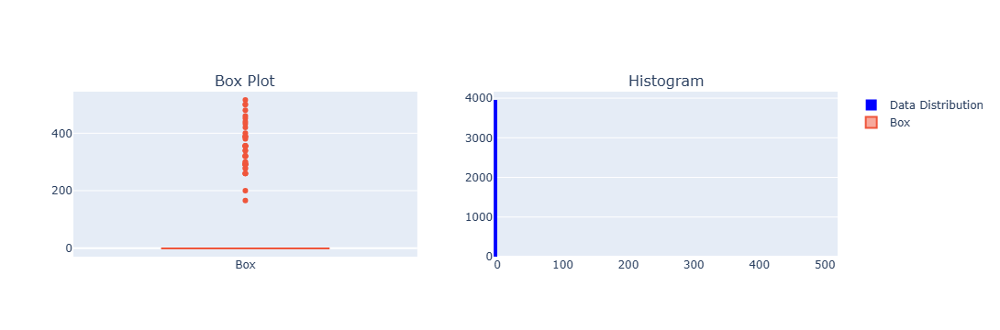

********** conscientiousness **********


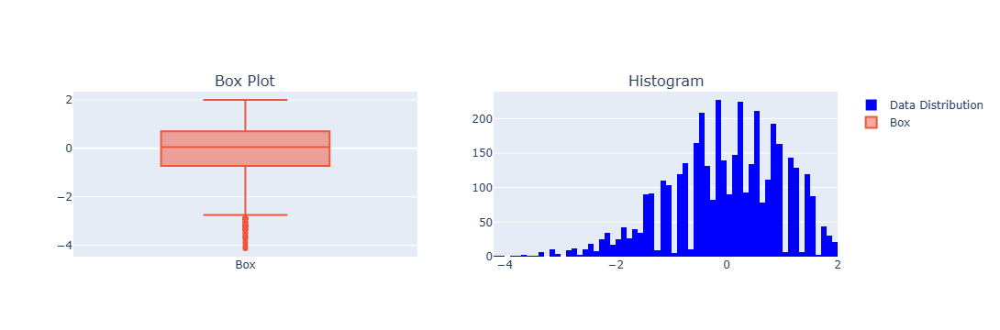

********** agreeableness **********


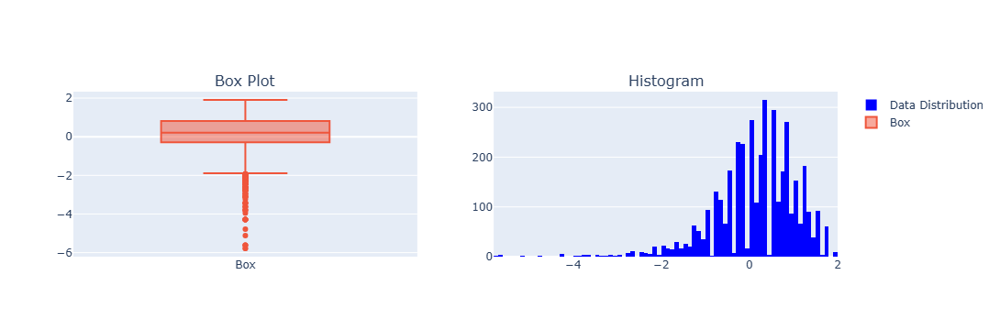

********** extraversion **********


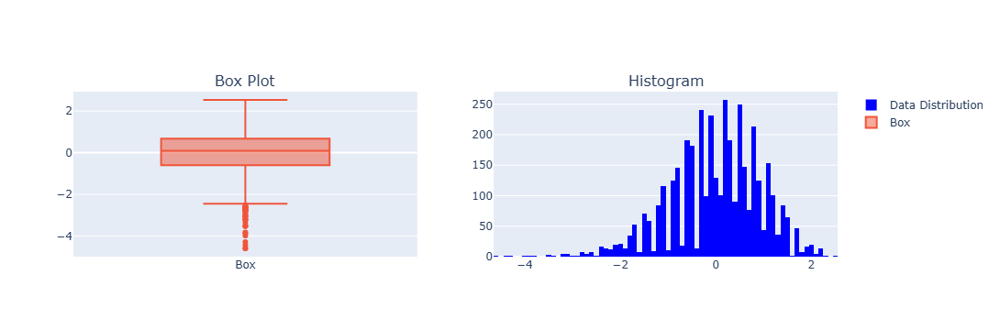

********** nueroticism **********


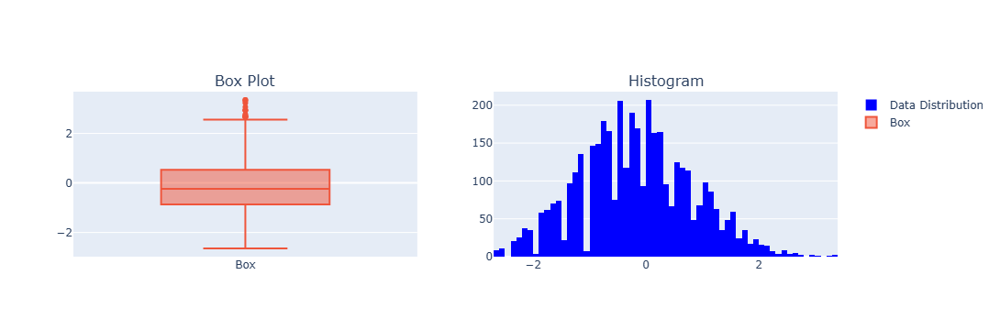

********** openess_to_experience **********


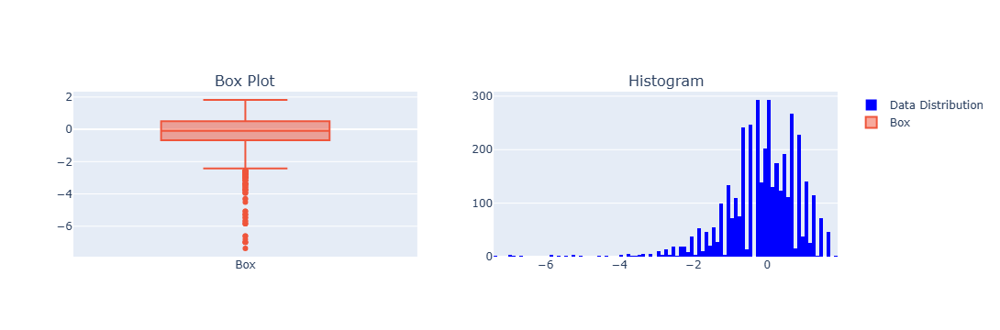

In [677]:
def num_box_plots(columns):
    for col in columns:
        print("*"*10,f"{col}","*"*10)

        #for subplots
        fig = make_subplots(rows=1, cols=2,subplot_titles=("Box Plot", "Histogram"))

        #plotting histogram
        histogram  = go.Histogram(x=num[col], name='Data Distribution', marker_color='blue')
        fig.add_trace(histogram,row=1, col=2)

        #plotting box plots
        box_data = go.Box(y=num[col], name='Box')
        fig.add_trace(box_data, row=1, col=1)
        
        fig.show()
num_box_plots(req_num_cols)

#### Outlier Detection

In [501]:
def outliers(columns):
    for col in columns:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3-q1
    
        lower_bound = q1 - 1.5*iqr
        upper_bound = q3 + 1.5*iqr
    
        outliers = len(df[(df[col]<lower_bound) | (df[col]>upper_bound)]) 
        
        print(f" Number of Outliers in {col}: {outliers}")
outliers(req_num_cols)

 Number of Outliers in Salary: 109
 Number of Outliers in 10percentage: 30
 Number of Outliers in 12percentage: 1
 Number of Outliers in collegeGPA: 38
 Number of Outliers in English: 15
 Number of Outliers in Logical: 18
 Number of Outliers in Quant: 25
 Number of Outliers in Domain: 246
 Number of Outliers in ElectronicsAndSemicon: 2
 Number of Outliers in ComputerScience: 902
 Number of Outliers in MechanicalEngg: 235
 Number of Outliers in ElectricalEngg: 161
 Number of Outliers in TelecomEngg: 374
 Number of Outliers in CivilEngg: 42
 Number of Outliers in conscientiousness: 39
 Number of Outliers in agreeableness: 123
 Number of Outliers in extraversion: 40
 Number of Outliers in nueroticism: 15
 Number of Outliers in openess_to_experience: 95


<div style="text-align: center;">
    <h3><em>Categorical Columns</em></h3>
</div>

In [387]:
cat.columns

Index(['Unnamed: 0', 'Designation', 'JobCity', 'Gender', '10board', '12board',
       'Degree', 'Specialization', 'CollegeState'],
      dtype='object')

In [505]:
req_cat_cols = ['Designation', 'JobCity', 'Gender', '10board','12board', 'Degree', 'Specialization']

#### Statistical Summary of Categorical Data

In [511]:
def cat_univariate_statistical_analysis(columns):
    for col in columns:
        print("*"*10,f"{col}","*"*10)
        print(df[col].agg(["unique","nunique"]))
        print()
cat_univariate_statistical_analysis(req_cat_cols)

********** Designation **********
unique     [senior quality engineer, assistant manager, s...
nunique                                                  419
Name: Designation, dtype: object

********** JobCity **********
unique     [Bangalore, Indore, Chennai, Gurgaon, Manesar,...
nunique                                                  339
Name: JobCity, dtype: object

********** Gender **********
unique     [f, m]
nunique         2
Name: Gender, dtype: object

********** 10board **********
unique     [board ofsecondary education,ap, cbse, state b...
nunique                                                  275
Name: 10board, dtype: object

********** 12board **********
unique     [board of intermediate education,ap, cbse, sta...
nunique                                                  340
Name: 12board, dtype: object

********** Degree **********
unique     [B.Tech/B.E., MCA, M.Tech./M.E., M.Sc. (Tech.)]
nunique                                                  4
Name: Degree, dtype: ob

#### Visualizing Categorical Data

********** Designation **********


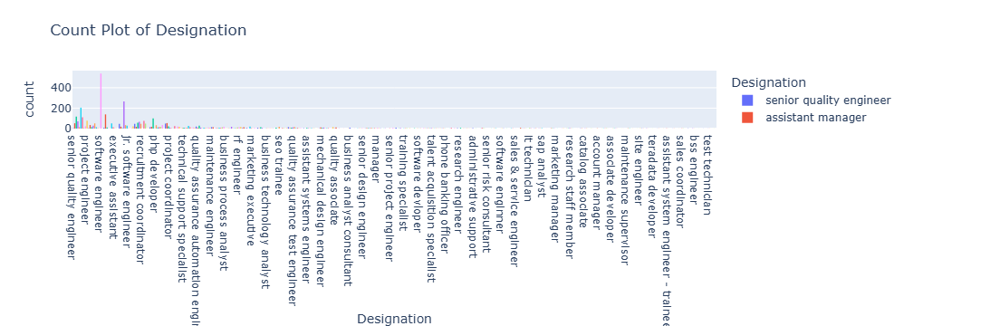

********** JobCity **********


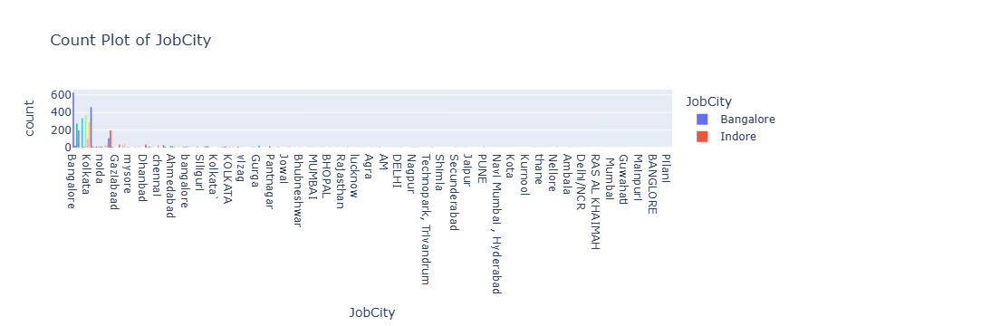

********** Gender **********


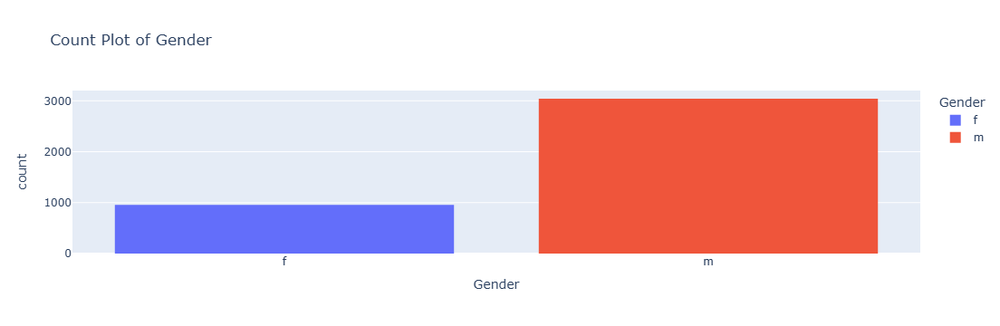

********** 10board **********


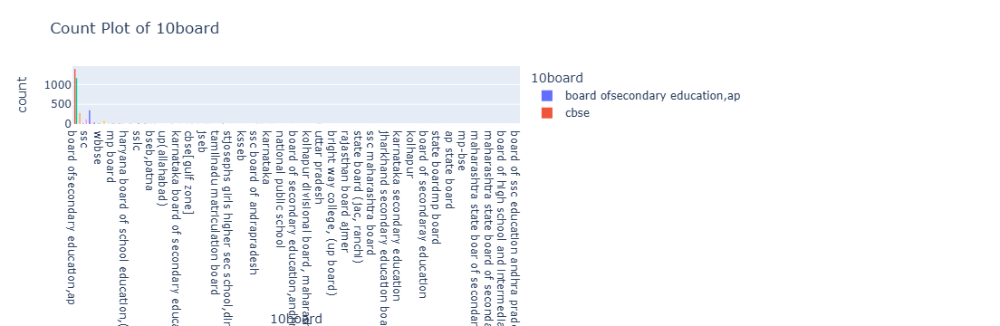

********** 12board **********


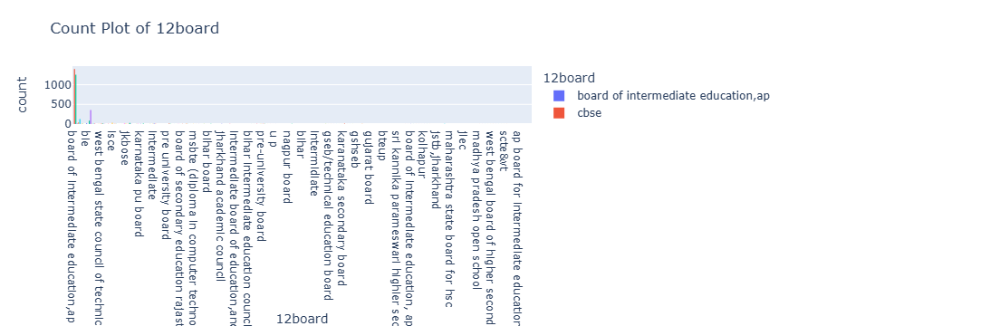

********** Degree **********


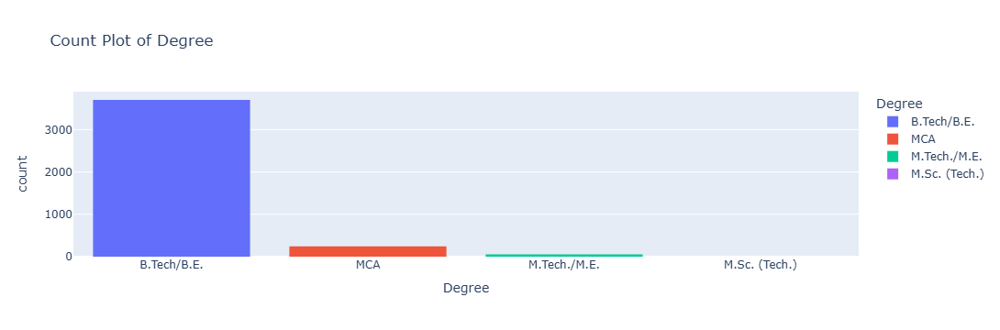

********** Specialization **********


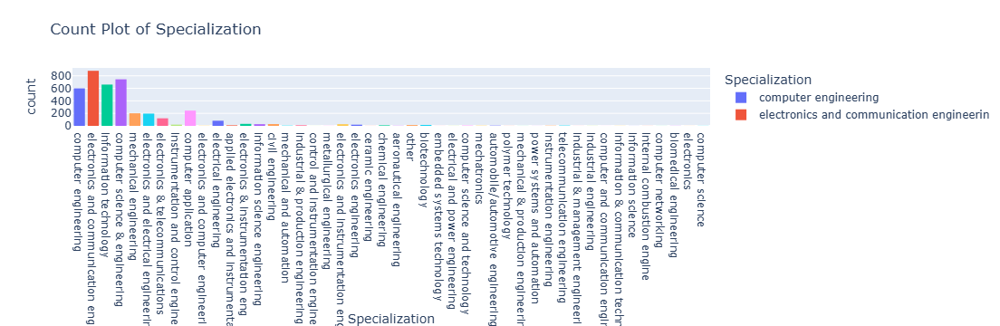

In [517]:
def cat_box_plots(columns):
    for col in columns:
        print("*"*10,f"{col}","*"*10)
        # Plot a count plot
        fig = px.histogram(df, x=col, color=col, title=f'Count Plot of {col}')

        # Show the plot
        fig.show()
cat_box_plots(req_cat_cols)

<div style="text-align: center;">
    <h2><em>Bivariate Analysis</em></h2>
</div>

#### Top Designations by Number of Employees

In [539]:
#Getting number of employees in each designation
des_count = df["Designation"].value_counts()

# Step 2: Getting designations where number of employees is greater than 50
des_above_50 = des_count[des_count > 50].index

# Step 3: Using .isin() to filter the DataFrame
filtered_df_des = df[df["Designation"].isin(des_above_50)]

# Displaying the filtered DataFrame
filtered_df_des["Designation"].value_counts()

Designation
software engineer             539
software developer            265
system engineer               205
programmer analyst            139
systems engineer              118
java software engineer        111
software test engineer        100
project engineer               77
technical support engineer     76
senior software engineer       72
java developer                 67
test engineer                  57
web developer                  54
assistant manager              52
application developer          52
network engineer               51
Name: count, dtype: int64

- The fact that designations like Software Engineer (539), Software Developer (265), and Java Software Engineer (111) are at the top indicates a significant demand for software-related skills. 

#### Top Cities by Number of Jobs

In [536]:
# Step 1: Getting value counts of JobCity
city_counts = df["JobCity"].value_counts()

# Step 2: Getting cities where count is greater than 150
cities_above_150 = city_counts[city_counts > 150].index

# Step 3: Using .isin() to filter the DataFrame
filtered_df_Jobcity = df[df["JobCity"].isin(cities_above_150)]

# Displaying the filtered DataFrame
filtered_df_Jobcity["JobCity"].value_counts().reset_index()


,JobCity,count
0,Bangalore,627
1,-1,461
2,Noida,368
3,Hyderabad,335
4,Pune,290
5,Chennai,272
6,Gurgaon,198
7,New Delhi,196


- These cities contain 70% of the total employees.
- The fact that 70% of employees are concentrated in these cities indicates that these cities are hubs for employment. This suggests a higher    concentration of companies, especially in sectors such as IT, software, and services.
- Bangalore, for instance, is often called the "Silicon Valley of India."

#### Top Specializations by Salary

In [405]:
#filtering dataframe on the basis of salary
df_salary = df[df["Salary"] > 300000]

# Display the filtered DataFrame
df_salary["Specialization"].value_counts()

Specialization
electronics and communication engineering      396
computer engineering                           365
information technology                         328
computer science & engineering                 291
mechanical engineering                          89
electronics and electrical engineering          81
computer application                            73
electronics & telecommunications                56
electrical engineering                          35
electronics & instrumentation eng               17
civil engineering                               16
information science engineering                 12
instrumentation and control engineering         11
electronics and instrumentation engineering     11
electronics engineering                          9
industrial & production engineering              7
chemical engineering                             6
biotechnology                                    6
applied electronics and instrumentation          4
telecommunicatio

- The top three specializations—Electronics and Communication Engineering (396), Computer Engineering (365), and Information Technology (328)—clearly indicate that computer-related fields dominate in terms of the number of employees earning high salaries.
- This suggests a strong market demand for skills in these areas, likely driven by the tech industry's growth, leading to higher compensation for professionals in these fields.
- More than 50% people are from CSE background making it high in demand specialization.
- Out of those people from CSE background 50% are making more than 300000 showing why the demand is high.

#### College Tier vs Salary

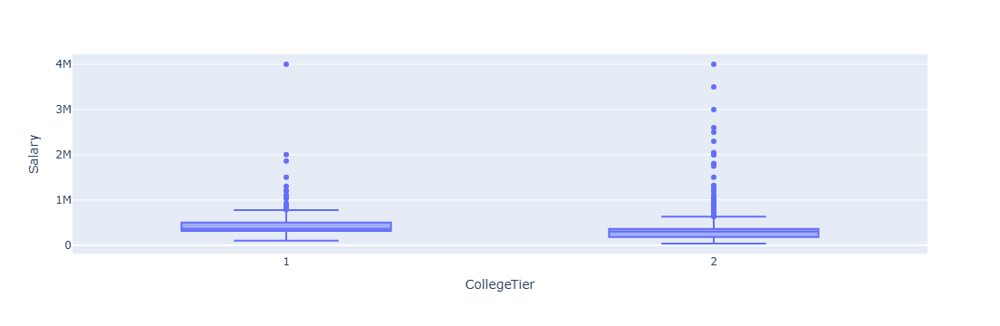

In [607]:
fig = px.box(df, x=df['CollegeTier'], y=df['Salary'])
fig.show()

- 75% students from tier 1 college have higher salaries than 50% students from tier 2 college
- Salaries are higher for tier 1 college students

#### Experience vs Salary

In [413]:
print("*"*20,"Date Of Joining","*"*20)
print(df[df["Salary"]>755000]["DOJ"].min())
print(df[df["Salary"]>755000]["DOJ"].max())

******************** Date Of Joining ********************
2010-01-01 00:00:00
2015-06-01 00:00:00


#### Checking Mobility in different Specializations

In [560]:
df_copy = df.copy()
# Calculating tenure in days
df_copy['TenureDays'] = (df_copy['DOL'] - df_copy['DOJ']).dt.days

# Converting tenure to years
df_copy['TenureYears'] = df_copy['TenureDays'] / 365

In [618]:
df_copy[df_copy["TenureYears"]<2]["Designation"].value_counts().reset_index().head(60)

,Designation,count
0,software engineer,168
1,software developer,128
2,system engineer,65
3,technical support engineer,51
4,java software engineer,48
5,programmer analyst,37
6,web developer,36
7,systems engineer,31
8,software test engineer,31
9,java developer,30


- The top three designations—Software Engineer (168), Software Developer (128), and System Engineer (65)—indicate that a significant number of candidates in software-related roles are experiencing job tenure of less than 2 years.
- This suggests high mobility within the tech sector, possibly driven by the search for better opportunities, salary increments, or career advancement.

#### Salary vs Gender

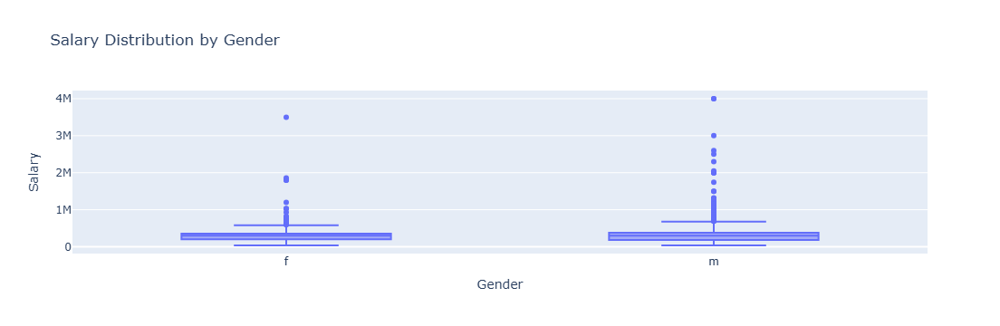

In [425]:
# Creating a box plot
fig = px.box(df, x=df['Gender'], y=df['Salary'], title='Salary Distribution by Gender')

# Showing the plot
fig.show()

- box plots of salary distribution for both males and females here show similar distributions despite the significant disparity in the number of males and females.
- This might show that males and females are being compensated fairly relative to each other, which might indicate that the organization or industry is adhering to equitable pay practices regardless of gender.

#### Average Salary by Graduation Year

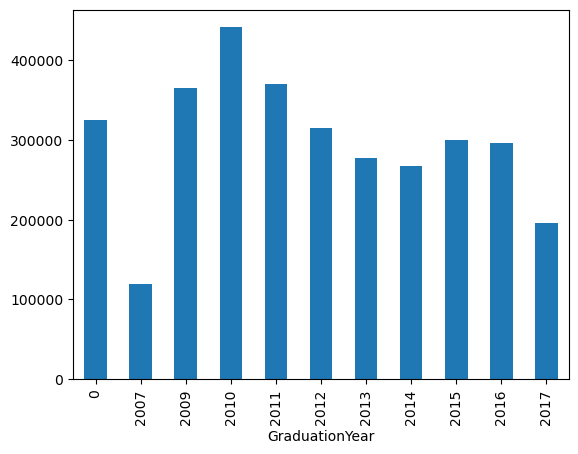

In [428]:
avg_salary_by_year = df.groupby('GraduationYear')['Salary'].mean()
avg_salary_by_year.plot(kind='bar')
plt.show()

#### Age vs Salary 

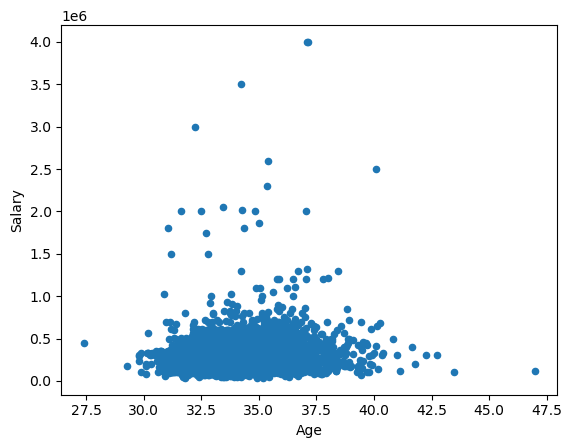

In [436]:
df['Age'] = (datetime.now() - df['DOB']).dt.days / 365
df.plot(kind='scatter', x='Age', y='Salary')
plt.show()

- This plot suggests that salaries are more closely tied to talent and specific qualifications rather than age.

#### College GPA vs Salary

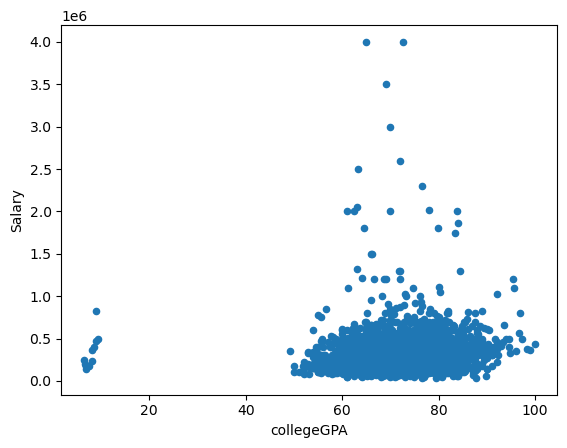

In [439]:
df.plot(kind='scatter', x='collegeGPA', y='Salary')
plt.show()

- Again this plot suggests that salaries are more closely tied to talent and specific qualifications rather than age because it is clear here that many people with higher gpas have low salaries and many people with lower gpas have high salaries.

#### CollegeTier vs Salary

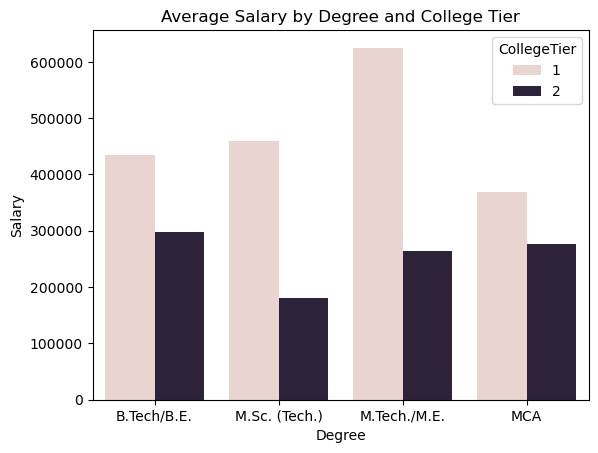

In [442]:
# Grouping by Degree and CollegeTier to calculate average salary
avg_salary = df.groupby(['Degree', 'CollegeTier'])['Salary'].mean().reset_index()

# Creating a bar plot with hue
sns.barplot(x='Degree', y='Salary', hue='CollegeTier', data=avg_salary)

# Adding titles
plt.title('Average Salary by Degree and College Tier')

# Showing the plot
plt.show()

- It is clear from the plot that tier 1 colleges are producing employees having higher salaries than tier 2 colleges.
- Reasons may be Access to Internship and Placement Programs, Networking Opportunities, Reputation and Brand Value, Quality of Education etc.

In [444]:
personality_traits_list = ["conscientiousness","agreeableness","extraversion","nueroticism","openess_to_experience"]

#### Traits vs Gender

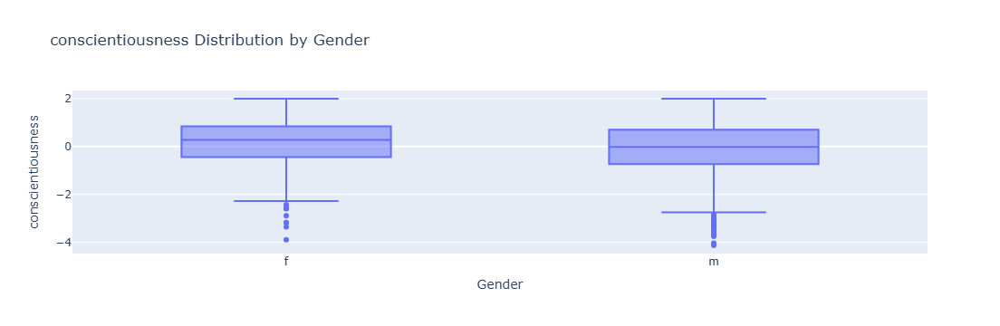

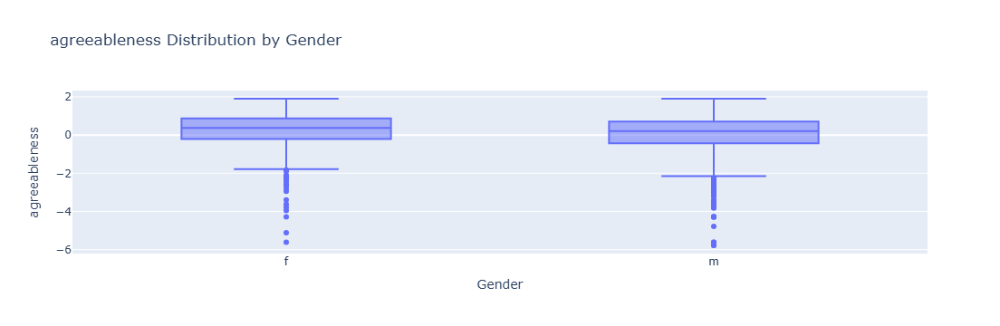

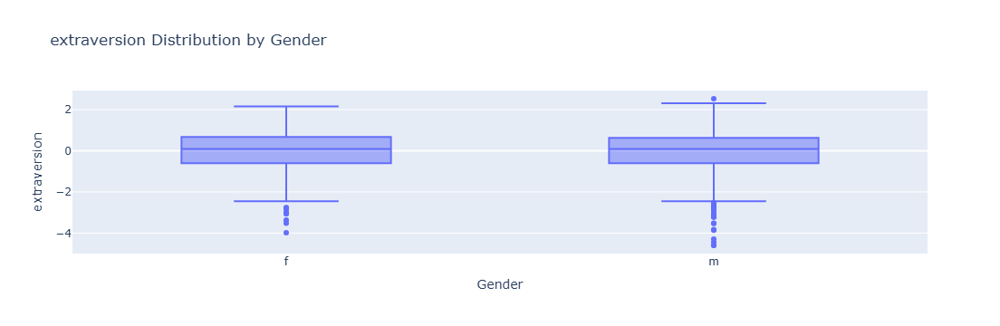

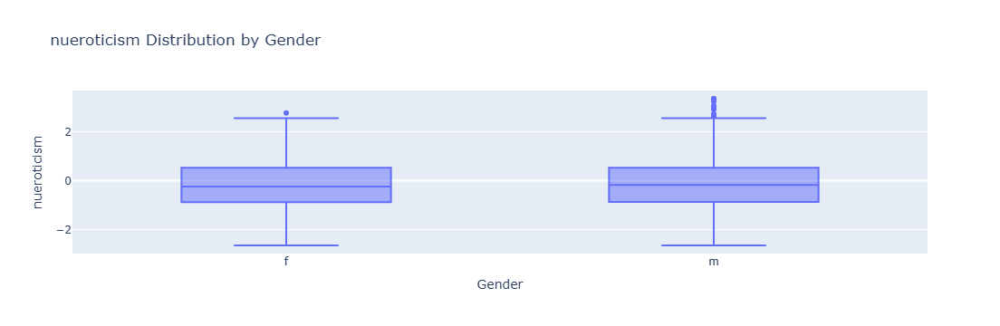

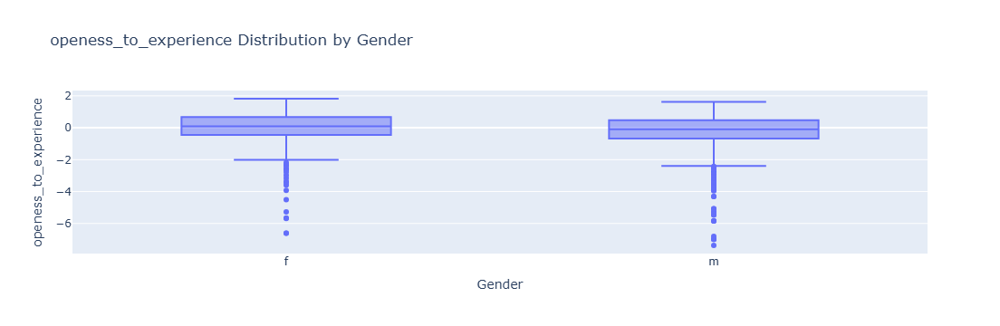

In [590]:
def personality_traits(columns):
    for col in columns:
        fig = px.box(df, x='Gender', y=col, title=f'{col} Distribution by Gender')
        fig.show()
personality_traits(personality_traits_list)

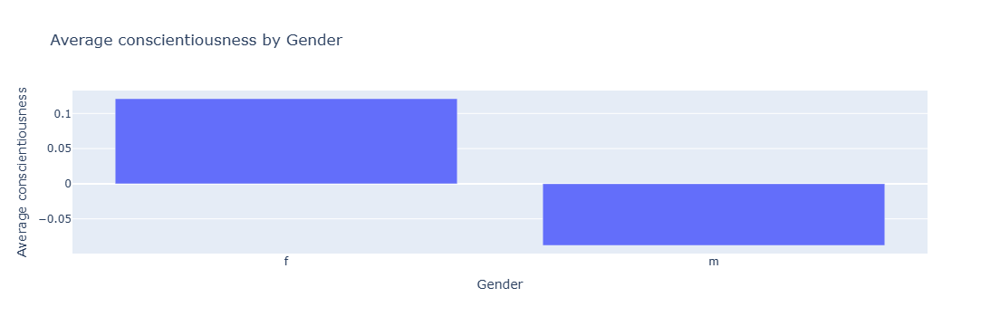

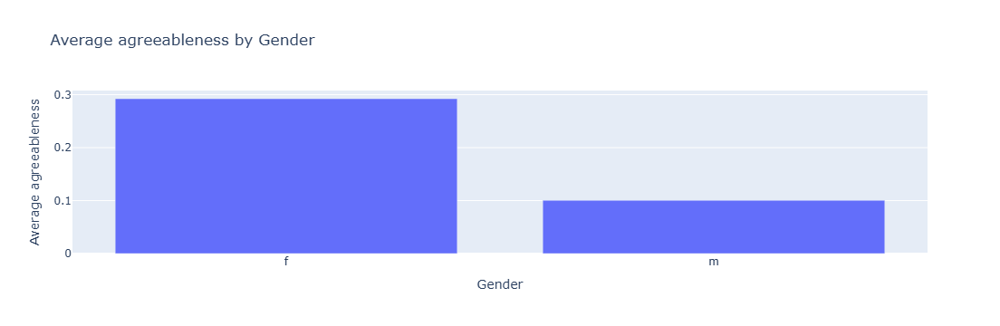

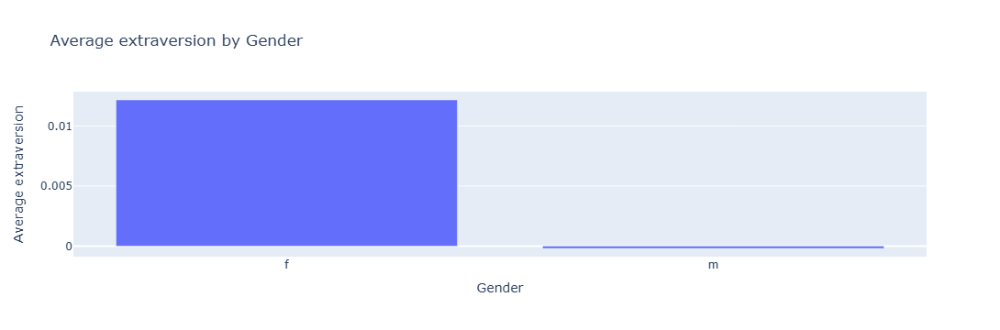

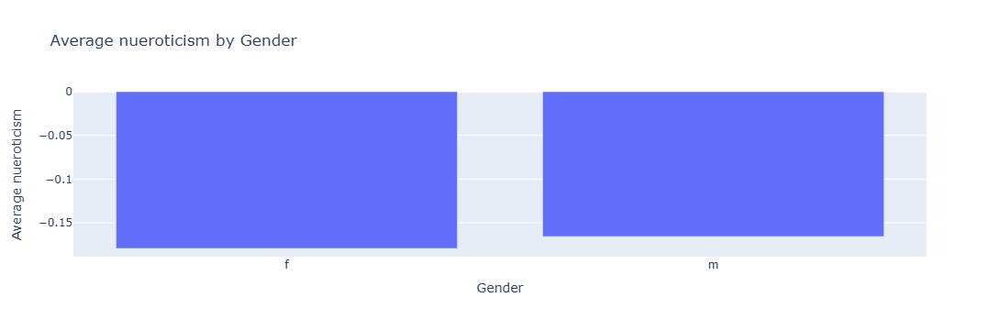

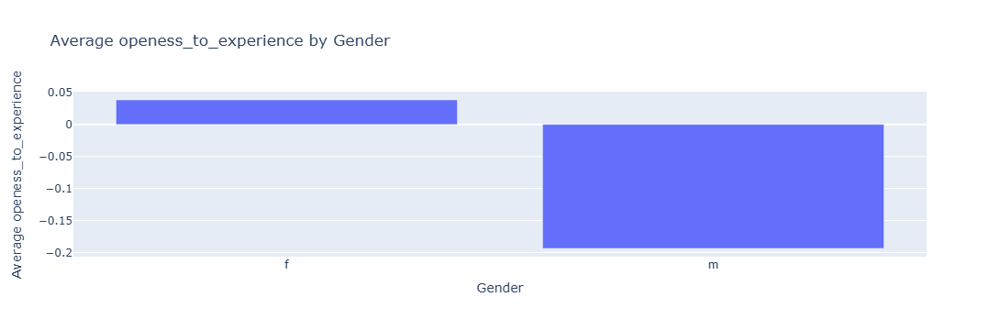

In [592]:
def personality_traits_bar(columns):
    for col in columns:
            avg_traits = df.groupby('Gender', as_index=False).agg({col: 'mean'})
            
            # Create a bar plot
            fig = px.bar(avg_traits, 
                         x='Gender', 
                         y=col, 
                         title=f'Average {col} by Gender',
                         labels={col: f'Average {col}'})
            
            # Show the figure
            fig.show()
personality_traits_bar(personality_traits_list)

- Conscientiousness is slightly greater in females than males in workplace.
- Same with agreableness, extraversion and openess_to_experience.
- Neuroticism is slightly greater in males showing females have higher mental stability in workplace.
- Both types of graphs show the same trend.

<div style="text-align: center;">
    <h2><em>Research Question</em></h2>
</div>

#### Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a 
#### Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh 
#### graduate.

- Testing this claim

In [460]:
Designation = ["programmer analyst","junior software engineer","associate software engineer",'jr. software engineer',]

In [462]:
df_updated = df[df["Designation"].isin(Designation)]
avg_salary_des = df_updated.groupby("Designation")["Salary"].mean().reset_index()
avg_salary_des

,Designation,Salary
0,associate software engineer,307065.217391
1,jr. software engineer,218333.333333
2,junior software engineer,247777.777778
3,programmer analyst,339784.172662


- The claim holds true as shown above.

#### Gender vs Specialization

In [645]:
df_female  = df[df["Gender"]=="f"]
df_male  = df[df["Gender"]=="m"]

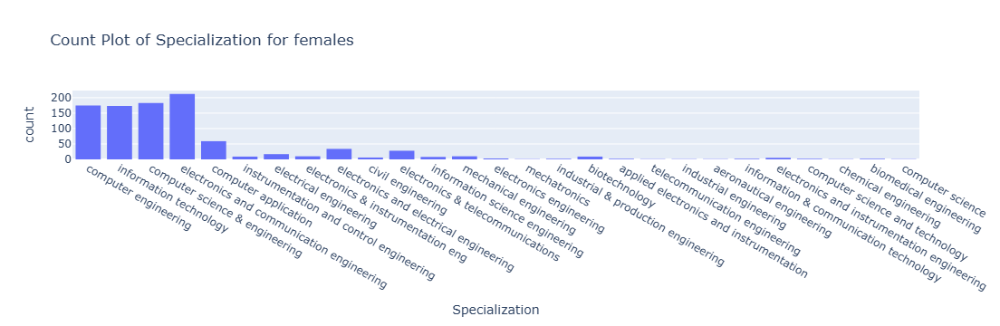

In [661]:
fig_1 = px.histogram(df_female, x=df_female["Specialization"], title="Count Plot of Specialization for females")
fig_1.show()

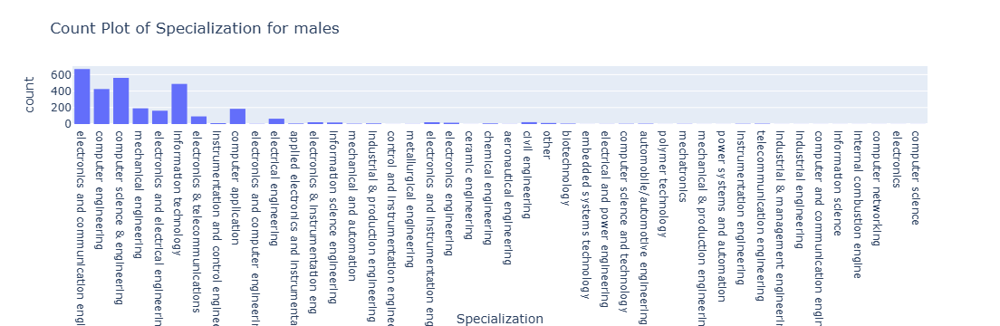

In [659]:
fig_2 = px.histogram(df_male, x=df_male["Specialization"], title="Count Plot of Specialization for males")
fig_2.show()

- These graphs show that the preferences of both the genders are CS and ECE related specializations but there are significant numbers of males in mechanical engineering in comparison to females.